# PyCaret Demo Walkthrough

PyCaret is a low-code Python module with a very wide range of applications. As of yet, it's capable of pre-processing, comparing & creating machine learning models in one or a handful of lines regarding Classification, Regression, Clustering, Anomaly Detection, NLP and Association Rule Mining. It also enables you to use ensemble, blending & stacking methods on top of your models! Check out the article below to get a first impression:

https://towardsdatascience.com/announcing-pycaret-an-open-source-low-code-machine-learning-library-in-python-4a1f1aad8d46

If you want to learn more about PyCaret, check out their website: https://pycaret.org/. It has an incredible amount of clear documentation, tutorials, video's & walkthrough's on model deployment!

I believe these types of low-code modules will become the industry standard in the near future and I'm really excited to see what future implementations are on the horizon!

In this notebook we'll demonstrate some of the various practical applications & use cases of PyCaret. In particular, we'll be looking at pre-processing, regression, classification, clustering & NLP use cases.

### Prerequisites

First of all we need to install pycaret and (if necessary) update/install the right version of scikit-learn & pandas. To do this, simply uncomment the required package installation lines and run the code block below.

In [1]:
## Install the PyCaret module (this might take a while)
# !pip install pycaret

## If you run into errors, it might be due to a different version of scikit-learn or pandas
# !pip install scikit-learn==0.22
# !pip install pandas==0.23.0

In [2]:
# Import modules
from ipywidgets import *
import pycaret
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

### 1. Pre-processing

First let's get one of the datasets provided by PyCaret. You can use whatever dataset you'd like to work with, but for the sake of this demo we'll use some of PyCaret's standard datasets.

Check out this link to see all available datasets you can play with:
https://pycaret.org/get-data/

In [3]:
# Import dataset from pycaret repository
from pycaret.datasets import get_data
bank_data = get_data('bank')

,age,job,marital,education,default,balance,housing,loan,contact,day,month,duration,campaign,pdays,previous,poutcome,deposit
0,58,management,married,tertiary,no,2143,yes,no,unknown,5,may,261,1,-1,0,unknown,no
1,44,technician,single,secondary,no,29,yes,no,unknown,5,may,151,1,-1,0,unknown,no
2,33,entrepreneur,married,secondary,no,2,yes,yes,unknown,5,may,76,1,-1,0,unknown,no
3,47,blue-collar,married,unknown,no,1506,yes,no,unknown,5,may,92,1,-1,0,unknown,no
4,33,unknown,single,unknown,no,1,no,no,unknown,5,may,198,1,-1,0,unknown,no


For this example we're looking at a bank dataset with various characteristics of a client and a target variable of whether a client has deposited or not.

As you can see from the code below, there are many available options for setting up the pre-processing (click 'Shift + Tab' with your cursor on the function to check out all of its available settings and additional information per setting). 
Once you run the code, you'll see all the options and setting PyCaret has inferred. It's up to you to review these inferred settings and either press 'Enter' to confirm all settings are OK, or type 'quit' to exit the setup and change one or some of the settings.

In many cases (especially when doing a quick & dirty analysis) you don't have to specify many options, as most of the time the settings are confirmed correctly. Next to that, a lot of options are used only for specific types of algorithms (classification, regression, clustering, NLP, etc.), so you'd only have any need to define them when you want to use a specific method using a specific algorithm.

If you want to check out which particular settings are available for which type of algorithm, check out these sources:

https://pycaret.org/setup/

https://pycaret.org/preprocessing/

In [4]:
from pycaret.classification import *
setup = setup(data = bank_data, target = 'deposit', train_size = 0.7,)
#     sampling=True,
#     sample_estimator=None,
#     categorical_features=None,
#     categorical_imputation='constant',
#     ordinal_features=None,
#     high_cardinality_features=None,
#     high_cardinality_method='frequency',
#     numeric_features=None,
#     numeric_imputation='mean',
#     date_features=None,
#     ignore_features=None,
#     normalize=False,
#     normalize_method='zscore',
#     transformation=False,
#     transformation_method='yeo-johnson',
#     handle_unknown_categorical=True,
#     unknown_categorical_method='least_frequent',
#     pca=False,
#     pca_method='linear',
#     pca_components=None,
#     ignore_low_variance=False,
#     combine_rare_levels=False,
#     rare_level_threshold=0.1,
#     bin_numeric_features=None,
#     remove_outliers=False,
#     outliers_threshold=0.05,
#     remove_multicollinearity=False,
#     multicollinearity_threshold=0.9,
#     create_clusters=False,
#     cluster_iter=20,
#     polynomial_features=False,
#     polynomial_degree=2,
#     trigonometry_features=False,
#     polynomial_threshold=0.1,
#     group_features=None,
#     group_names=None,
#     feature_selection=False,
#     feature_selection_threshold=0.8,
#     feature_interaction=False,
#     feature_ratio=False,
#     interaction_threshold=0.01,
#     transform_target=False,
#     transform_target_method='box-cox',
#     session_id=None,
#     silent=False,
#     profile=False
# )

 
Setup Succesfully Completed!


,Description,Value
0,session_id,2553
1,Target Type,Binary
2,Label Encoded,"no: 0, yes: 1"
3,Original Data,"(45211, 17)"
4,Missing Values,False
5,Numeric Features,7
6,Categorical Features,9
7,Ordinal Features,False
8,High Cardinality Features,False
9,High Cardinality Method,None


### 2. Regression

Now that we've got the specifics of pre-processing down, let's get our hands dirty with building a Linear Regression model!

First of all, let's use a dataset which can be used for regression.

In [5]:
# Import dataset from pycaret repository
from pycaret.datasets import get_data
insurance_data = get_data('insurance')

,age,sex,bmi,children,smoker,region,charges
0,19,female,27.900,0,yes,southwest,16884.92400
1,18,male,33.770,1,no,southeast,1725.55230
2,28,male,33.000,3,no,southeast,4449.46200
3,33,male,22.705,0,no,northwest,21984.47061
4,32,male,28.880,0,no,northwest,3866.85520


Allright, we have our dataset! We see some features of people and where they live, with the target variable of how many insurance charges they incur. It's up to us to create a model that can estimate the charges based on a person's profile. As we can see, there aren't too many features.. Let's play around with some features to enrich the data we have (without actually changing the values).

In this example, we've set up the following extra settings for our setup:

- session_id = 1234
- normalize = True
- polynomial_features = True
- trigonometry_features = True
- feature_interaction = True
- bin_numeric_features = ['age', 'bmi']

Check out what these settings exactly do by pressing 'Shift + Tab' when on the row with the setup() function and looking up each setting ('Ctrl + F' might come in handy)!

Basically, we're normalizing the data, creating new features based on polynomial & trigonometric combinations, feature interactions, and binning the age & bmi features (based on K-means clusters optimized for Gaussian datasets). But first, we're going to hold out 10% of the data to predict on when we've created our final model.

In [6]:
# Hold out 10% of the dataset for predicting with the final model
data = insurance_data.sample(frac=0.9, random_state=1234).reset_index(drop=True)
data_unseen = insurance_data.drop(data.index).reset_index(drop=True)

print('Data for Modeling: ' + str(data.shape))
print('Unseen Data For Predictions: ' + str(data_unseen.shape))

Data for Modeling: (1204, 7)
Unseen Data For Predictions: (134, 7)


In [7]:
# Initialize environment
from pycaret.regression import *
regression_setup = setup(data, target = 'charges', train_size = 0.7,
           session_id = 1234,
           normalize = True,
           polynomial_features = True, 
           trigonometry_features = True,
           feature_interaction = True, 
           bin_numeric_features = ['age', 'bmi'])

 
Setup Succesfully Completed!


,Description,Value
0,session_id,1234
1,Transform Target,False
2,Transform Target Method,None
3,Original Data,"(1204, 7)"
4,Missing Values,False
5,Numeric Features,2
6,Categorical Features,4
7,Ordinal Features,False
8,High Cardinality Features,False
9,High Cardinality Method,None


Now that we have the pre-processing done, let's get to the fun part!

Using the compare_models() function you can check the performance of the most common regression algorithms based on whatever metric you'd like to score them on (again, check out the settings of the function to see what's possible).

In our example, let's use the widely used R2 to check model performance and run them in 10 folds for robustness. We're also excluding 3 algorithms which took a while or had some issues with the Pandas version.

In [8]:
## Check the dataset values after pre-processing
# regression_setup[0]

In [9]:
# Compare models based on R2 score
compare_models(blacklist = ['ransac', 'tr', 'catboost'], fold = 10, sort = 'R2')

,Model,MAE,MSE,RMSE,R2,RMSLE,MAPE
0,Extreme Gradient Boosting,2751.68,2.38867e+07,4845.49,0.8242,0.4438,0.3133
1,Lasso Least Angle Regression,3024.35,2.44107e+07,4911.24,0.8203,0.4173,0.3007
2,Orthogonal Matching Pursuit,3008.76,2.44556e+07,4918.17,0.8198,0.4033,0.289
3,Ridge Regression,3058.51,2.47393e+07,4942.91,0.8178,0.43,0.3101
4,Bayesian Ridge,3069.08,2.47372e+07,4943.08,0.8178,0.4276,0.3113
5,Lasso Regression,3049.19,2.47741e+07,4946.09,0.8175,0.437,0.3092
6,Linear Regression,3063.82,2.48739e+07,4955.75,0.8168,0.4453,0.3125
7,Gradient Boosting Regressor,2844.01,2.50137e+07,4964.25,0.8154,0.4541,0.3244
8,Light Gradient Boosting Machine,2982.56,2.58945e+07,5062.37,0.8092,0.4952,0.344
9,Huber Regressor,2145.2,2.65926e+07,5123.28,0.8038,0.3775,0.0906


Allright nice! It seems Extreme Gradient Boosting (XGBoost) was the best performing algorithm in terms of R2, MSE & RMSE.

Let's train the model and check out what the model settings look like.

In [10]:
# Train the XGBoost model
xgboost_model = create_model('xgboost', fold = 10)

,MAE,MSE,RMSE,R2,RMSLE,MAPE
0,2343.3748,1.825656e+07,4272.7700,0.8594,0.3857,0.2741
1,3455.8106,3.705869e+07,6087.5849,0.7487,0.4716,0.3356
2,2583.7844,2.037022e+07,4513.3385,0.8308,0.4989,0.3386
3,2444.4953,1.551579e+07,3939.0091,0.8755,0.3939,0.3016
4,2387.5658,1.979416e+07,4449.0627,0.8808,0.3938,0.3042
5,2507.4953,2.105801e+07,4588.9009,0.8159,0.4696,0.2514
6,3177.0684,2.951265e+07,5432.5545,0.8252,0.4709,0.3455
7,2878.4418,2.282880e+07,4777.9491,0.8583,0.4134,0.3226
8,3062.7792,3.220562e+07,5674.9995,0.7540,0.5276,0.3457
9,2676.0232,2.226688e+07,4718.7793,0.7933,0.4130,0.3136


In [11]:
# save transformation pipeline and model
save_model(xgboost_model, model_name = 'C:/Users/705542/Desktop/Projects/PyCaret Demo Walkthrough/regression_12062020')
load_model('regression_12062020')

Transformation Pipeline and Model Succesfully Saved
Transformation Pipeline and Model Sucessfully Loaded


[Pipeline(memory=None,
          steps=[('dtypes',
                  DataTypes_Auto_infer(categorical_features=[],
                                       display_types=True, features_todrop=[],
                                       ml_usecase='regression',
                                       numerical_features=[], target='charges',
                                       time_features=[])),
                 ('imputer',
                  Simple_Imputer(categorical_strategy='not_available',
                                 numeric_strategy='mean',
                                 target_variable=None)),
                 ('new_levels1',
                  New_Catagorical_Levels...
                 ('dummy', Dummify(target='charges')),
                 ('fix_perfect', Remove_100(target='charges')),
                 ('clean_names', Clean_Colum_Names()),
                 ('feature_select', Empty()), ('fix_multi', Empty()),
                 ('dfs',
                  DFS_Classic(interactions

Cool! So in the above output we see what the setup we created looks like & the specific settings of our XGBoost model.

PyCaret also has the capability to improve your models by using methods like Hyperparameter Tuning or various Ensemble methods. Let's see if our model improves when we use Hyperparameter Tuning.

Check out this link for more information on model tuning: https://pycaret.org/tune-model/

In [12]:
# Tune the model
tuned_xgboost = tune_model('xgboost', fold = 10)

,MAE,MSE,RMSE,R2,RMSLE,MAPE
0,2739.7997,2.460116e+07,4959.9560,0.8105,0.4797,0.3136
1,4049.1363,4.442980e+07,6665.5686,0.6987,0.5324,0.3792
2,3243.3783,2.954145e+07,5435.2043,0.7546,0.6501,0.4345
3,2880.3081,2.050399e+07,4528.1335,0.8355,0.4609,0.3797
4,2927.0314,2.500574e+07,5000.5738,0.8494,0.5547,0.4933
5,3073.2279,2.609009e+07,5107.8460,0.7719,0.7438,0.2919
6,3458.7478,3.477106e+07,5896.6992,0.7940,0.5308,0.4104
7,3367.1859,3.273063e+07,5721.0692,0.7968,0.4848,0.3838
8,3389.2615,3.502885e+07,5918.5171,0.7325,0.5504,0.3368
9,3032.5394,3.038106e+07,5511.9019,0.7180,0.4701,0.3221


Apparently tuning the model doesn't seem to be helping much.

Let's see if we can improve the R2 of our model by using Ensemble methods like Bagging & Boosting! 

Check out this link for more information on ensemble models: https://pycaret.org/ensemble-model/

In [13]:
# Create a bagged ensemble model
model_bagged = ensemble_model(xgboost_model, method = 'Bagging', fold = 10)

,MAE,MSE,RMSE,R2,RMSLE,MAPE
0,2409.3543,1.901203e+07,4360.2790,0.8536,0.4121,0.2989
1,3282.1717,3.429533e+07,5856.2216,0.7674,0.4481,0.3103
2,2742.0217,2.161044e+07,4648.7032,0.8205,0.4988,0.3408
3,2463.6695,1.598389e+07,3997.9857,0.8718,0.4040,0.3167
4,2427.8887,1.963949e+07,4431.6459,0.8817,0.4378,0.3547
5,2542.5146,2.019912e+07,4494.3431,0.8234,0.4697,0.2561
6,3044.8601,2.775324e+07,5268.1342,0.8356,0.4544,0.3213
7,2675.5022,2.123073e+07,4607.6811,0.8682,0.3863,0.2860
8,2999.9681,3.074281e+07,5544.6203,0.7652,0.4971,0.3214
9,2668.2855,2.185515e+07,4674.9497,0.7971,0.4198,0.3218


In [14]:
# Create a boosted ensemble model
model_boosted = ensemble_model(xgboost_model, method = 'Boosting', fold = 10)

,MAE,MSE,RMSE,R2,RMSLE,MAPE
0,3722.0504,2.572414e+07,5071.8975,0.8019,0.5353,0.5529
1,4642.2060,4.038057e+07,6354.5708,0.7262,0.5667,0.5734
2,3951.4426,2.848421e+07,5337.0603,0.7634,0.6402,0.6661
3,3714.2656,2.226870e+07,4718.9721,0.8213,0.5362,0.5809
4,3710.4070,2.680609e+07,5177.4599,0.8386,0.6381,0.7384
5,3483.1205,2.260287e+07,4754.2477,0.8024,0.5162,0.4608
6,4263.4429,3.342235e+07,5781.2067,0.8020,0.6101,0.6262
7,4096.7950,3.040882e+07,5514.4193,0.8112,0.5349,0.5574
8,4214.1492,3.782132e+07,6149.9044,0.7112,0.6226,0.5417
9,4109.6861,2.767758e+07,5260.9490,0.7431,0.5849,0.6411


Bagging & Boosting seem to perform equally as well or worse. Let's try to blend our XGBoost model with the 3 second best performing models in terms of R2: the Gradient Boosting Regressor, Lasso Least Angle Regression and Ridge Regression.

Check this link for more information on blended models: https://pycaret.org/blend-models/

In [15]:
# Create Gradient Boosting model
gbr_model = create_model('gbr', fold = 10)

,MAE,MSE,RMSE,R2,RMSLE,MAPE
0,2432.6449,1.950205e+07,4416.1127,0.8498,0.4032,0.2830
1,3394.3414,3.542783e+07,5952.1284,0.7597,0.4624,0.3186
2,2861.5969,2.312160e+07,4808.4922,0.8080,0.5402,0.3961
3,2444.0093,1.593958e+07,3992.4406,0.8721,0.3837,0.2854
4,2522.0892,2.051801e+07,4529.6809,0.8764,0.4233,0.3369
5,2552.5594,2.157041e+07,4644.3959,0.8114,0.4639,0.2382
6,3232.8463,3.058550e+07,5530.4158,0.8188,0.4755,0.3542
7,2929.5703,2.469839e+07,4969.7471,0.8467,0.4176,0.3191
8,3235.1387,3.458672e+07,5881.0474,0.7359,0.5449,0.3798
9,2835.2625,2.418713e+07,4918.0411,0.7755,0.4263,0.3323


In [16]:
# Create Lasso Least Angle model
llar_model = create_model('llar', fold = 10)

,MAE,MSE,RMSE,R2,RMSLE,MAPE
0,2467.5352,1.731061e+07,4160.6024,0.8667,0.3617,0.2773
1,3599.1896,3.409720e+07,5839.2806,0.7688,0.4347,0.3125
2,3055.4817,2.504465e+07,5004.4628,0.7920,0.4789,0.3185
3,2947.6005,2.074778e+07,4554.9726,0.8335,0.4072,0.3255
4,2957.0192,2.248035e+07,4741.3443,0.8646,0.4034,0.3407
5,2950.2965,2.130051e+07,4615.2477,0.8138,0.4624,0.2687
6,3521.5759,3.160097e+07,5621.4738,0.8128,0.4209,0.2965
7,2976.8345,2.074583e+07,4554.7596,0.8712,0.3757,0.2985
8,3038.2724,3.076589e+07,5546.7007,0.7650,0.4482,0.2625
9,2729.6999,2.001296e+07,4473.5847,0.8142,0.3795,0.3058


In [17]:
# Create Ridge model
ridge_model = create_model('ridge', fold = 10)

,MAE,MSE,RMSE,R2,RMSLE,MAPE
0,2460.8304,1.689467e+07,4110.3131,0.8699,0.3755,0.2960
1,3700.9598,3.436253e+07,5861.9561,0.7670,0.4462,0.3298
2,3128.5008,2.641067e+07,5139.1316,0.7807,0.5110,0.3348
3,2972.3692,2.115110e+07,4599.0322,0.8303,0.4212,0.3348
4,2963.8185,2.275403e+07,4770.1190,0.8630,0.4022,0.3351
5,3002.2362,2.156189e+07,4643.4780,0.8115,0.4866,0.2812
6,3464.9122,3.083733e+07,5553.1370,0.8173,0.4213,0.2914
7,3066.6721,2.175834e+07,4664.5835,0.8649,0.3785,0.3062
8,3115.7470,3.215127e+07,5670.2092,0.7545,0.4684,0.2727
9,2709.0062,1.951118e+07,4417.1460,0.8189,0.3886,0.3190


In [18]:
# Blend both models
blended_model = blend_models(estimator_list = [xgboost_model, gbr_model, llar_model, ridge_model], fold = 10)

,MAE,MSE,RMSE,R2,RMSLE,MAPE
0,2328.5033,1.703026e+07,4126.7739,0.8688,0.3732,0.2782
1,3422.7048,3.296785e+07,5741.7637,0.7764,0.4410,0.3134
2,2754.6637,2.171858e+07,4660.3201,0.8196,0.4982,0.3374
3,2384.3624,1.606936e+07,4008.6607,0.8711,0.3783,0.2880
4,2544.7904,1.951769e+07,4417.8834,0.8825,0.3965,0.3212
5,2627.1040,1.981082e+07,4450.9348,0.8268,0.4523,0.2454
6,3133.6738,2.892924e+07,5378.5908,0.8286,0.4374,0.3107
7,2804.7834,2.059712e+07,4538.4046,0.8721,0.3866,0.3002
8,2993.3052,3.000617e+07,5477.7891,0.7708,0.4919,0.3055
9,2699.6055,2.025650e+07,4500.7225,0.8120,0.3934,0.3129


Hmm.. The blended model seems to be only marginally better performing. What if we stack our models, using the XGBoost model as our meta model and the others as estimator models?

Check this link for more information on stacked models: https://pycaret.org/stack-models/

In [19]:
# Stack the models
stacked_model = stack_models(estimator_list = [gbr_model, llar_model, ridge_model], meta_model = xgboost_model)

,MAE,MSE,RMSE,R2,RMSLE,MAPE
0,2240.6900,1.683526e+07,4103.0796,0.8703,0.3700,0.2692
1,3402.2044,3.566943e+07,5972.3889,0.7581,0.4539,0.3103
2,2712.1141,2.279541e+07,4774.4537,0.8107,0.5182,0.3620
3,2528.5067,1.764895e+07,4201.0658,0.8584,0.4126,0.3064
4,2598.8696,2.012691e+07,4486.3029,0.8788,0.4412,0.3696
5,2405.3032,1.991995e+07,4463.1774,0.8258,0.4884,0.2259
6,2896.2600,2.709272e+07,5205.0666,0.8395,0.4316,0.2948
7,2794.3421,2.305162e+07,4801.2104,0.8569,0.3802,0.2755
8,2985.0719,2.979272e+07,5458.2712,0.7725,0.4872,0.3407
9,2689.9475,2.179782e+07,4668.8137,0.7976,0.4078,0.3278


It seems we have no luck in improving our basic XGBoost model, so let's just run with the basic one. Having said that, doing the exercises above are still valuable to do, as they take very little time using PyCaret and might improve model performance drastically with different datasets & settings!

Having built so many variations on our model, it's time to see what's actually going on. Let's visualize some model plots!

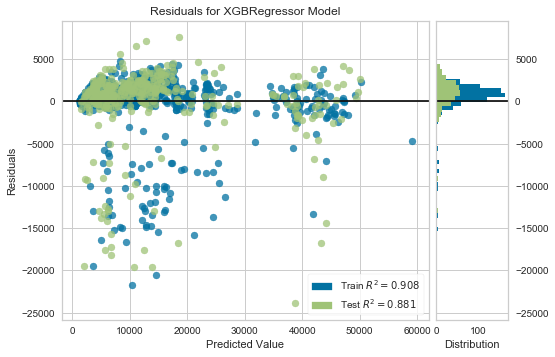

In [20]:
# %matplotlib inline

# Visualize the model plots 
# Note that this will visualize all plots in 1 widget if ipywidgets/nodejs is installed correctly
plot_model(xgboost_model)

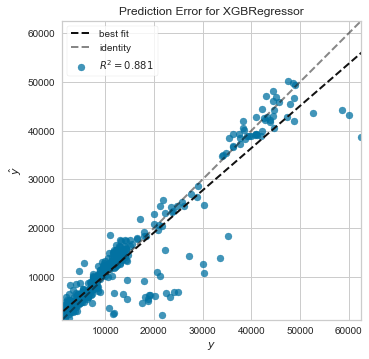

In [21]:
plot_model(xgboost_model, plot = 'error')

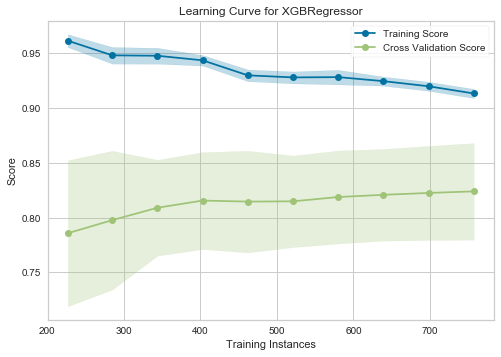

In [22]:
plot_model(xgboost_model, plot = 'learning')

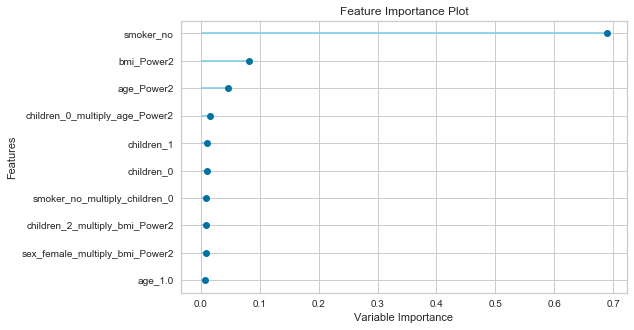

In [23]:
plot_model(xgboost_model, plot = 'feature')

Nice! Now we know we're doing quite well on the residuals & prediction error and we see that smoking is by far the most important factor to incurring insurance costs.

Now it's finally time to start predicting on our test set!

First, let's evaluate our model (this will show various insightful evaluation plots in 1 widget, however it doesn't seem to work for me in Jupyter Notebooks for some reason. Running the code in Google Colab for example might help with this issue though).

In [24]:
# Evaluate the model
# Note that this will show various plots which evaluate an aspect of the model if ipywidgets/nodejs is installed correctly
evaluate_model(xgboost_model)

,Parameters
base_score,0.5
booster,gbtree
colsample_bylevel,1
colsample_bynode,1
colsample_bytree,1
gamma,0
importance_type,gain
learning_rate,0.1
max_delta_step,0
max_depth,3


In [25]:
# # Summary plot of the model (use only with tree based models)
# interpret_model(xgboost_model, plot = 'summary')

In [26]:
# # Correlation plot of the model (use only with tree based models)
# interpret_model(xgboost_model, plot = 'correlation')

In [27]:
# Predict using the model
prediction = predict_model(xgboost_model)
prediction.head()

,Model,MAE,MSE,RMSE,R2,RMSLE,MAPE
0,Extreme Gradient Boosting Regressor,2616.2069,2.087046e+07,4568.42,0.8806,0.4272,0.2894


,bmi_Power2,age_Power2,sex_female,children_0,children_1,children_2,children_3,children_4,children_5,smoker_no,...,smoker_no_multiply_children_0,sex_female_multiply_bmi_Power2,children_0_multiply_bmi_Power2,region_northwest_multiply_bmi_Power2,children_0_multiply_age_Power2,age_7.0_multiply_region_southeast,region_southeast_multiply_bmi_Power2,region_southeast_multiply_age_Power2,charges,Label
0,-1.274944,-1.279893,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,...,0.0,-0.000000,-0.000000,-0.0,-0.000000,0.0,-1.274944,-1.279893,11884.04858,2608.074707
1,-1.274944,-0.070455,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,...,0.0,-0.000000,-0.000000,-0.0,-0.000000,0.0,-1.274944,-0.070455,6272.47720,5900.142090
2,2.231637,-0.538366,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,...,0.0,0.000000,0.000000,0.0,-0.000000,0.0,0.000000,-0.000000,4536.25900,5470.979492
3,2.087393,-1.279893,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,2.087393,2.087393,0.0,-1.279893,0.0,2.087393,-1.279893,38792.68560,38277.976562
4,-0.791894,-0.712162,1.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,...,1.0,-0.791894,-0.791894,-0.0,-0.712162,0.0,-0.791894,-0.712162,3756.62160,3978.357666


Allright, we have some predictions!

Now we're going to finalize the model. This function basically trains the model on both the train & test set of all the data to get some extra information. Note that it's never seen the 10% of data we excluded from the dataset initially (we'll use this data to test the final model with).

In [28]:
# Finalize the model (trained also on test set)
final_model = finalize_model(xgboost_model)

In [29]:
# Predict using the final model
final_prediction = predict_model(final_model)
final_prediction.head()

,Model,MAE,MSE,RMSE,R2,RMSLE,MAPE
0,Extreme Gradient Boosting Regressor,1929.6298,1.203461e+07,3469.0935,0.9311,0.301,0.214


,bmi_Power2,age_Power2,sex_female,children_0,children_1,children_2,children_3,children_4,children_5,smoker_no,...,smoker_no_multiply_children_0,sex_female_multiply_bmi_Power2,children_0_multiply_bmi_Power2,region_northwest_multiply_bmi_Power2,children_0_multiply_age_Power2,age_7.0_multiply_region_southeast,region_southeast_multiply_bmi_Power2,region_southeast_multiply_age_Power2,charges,Label
0,-1.274944,-1.279893,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,...,0.0,-0.000000,-0.000000,-0.0,-0.000000,0.0,-1.274944,-1.279893,11884.04858,8386.534180
1,-1.274944,-0.070455,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,...,0.0,-0.000000,-0.000000,-0.0,-0.000000,0.0,-1.274944,-0.070455,6272.47720,6433.917969
2,2.231637,-0.538366,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,...,0.0,0.000000,0.000000,0.0,-0.000000,0.0,0.000000,-0.000000,4536.25900,5371.150391
3,2.087393,-1.279893,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,2.087393,2.087393,0.0,-1.279893,0.0,2.087393,-1.279893,38792.68560,38683.019531
4,-0.791894,-0.712162,1.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,...,1.0,-0.791894,-0.791894,-0.0,-0.712162,0.0,-0.791894,-0.712162,3756.62160,3408.324463


Great! Now it's time to predict on the unseen 10% test set to see how good our model really is.

In [30]:
# Predict on the final test set (10% held out)
unseen_predictions = predict_model(final_model, data = data_unseen)
unseen_predictions.head()

,age,sex,bmi,children,smoker,region,charges,Label
0,18,female,27.280,3,yes,southeast,18223.45120,17157.923828
1,35,male,17.860,1,no,northwest,5116.50040,5173.630371
2,59,female,34.800,2,no,southwest,36910.60803,20177.117188
3,36,male,33.400,2,yes,southwest,38415.47400,38866.257812
4,37,female,25.555,1,yes,northeast,20296.86345,20174.949219


In [31]:
# Calculate the final R2 score on the unseen test set
from sklearn.metrics import r2_score
y_true = unseen_predictions['charges']
y_pred = unseen_predictions['Label']
print('Our final model has an R2 score of:', r2_score(y_true, y_pred), 'on the unseen test set!')

Our final model has an R2 score of: 0.9122692196024795 on the unseen test set!


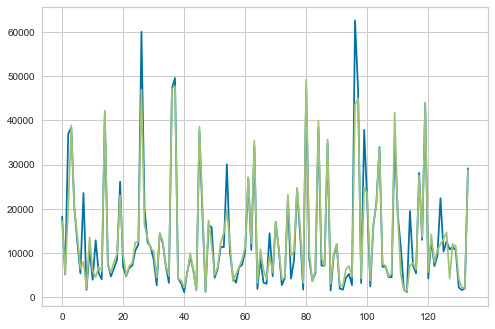

In [32]:
# Plot the predicted & actual values
y_true.plot()
y_pred.plot()

In [33]:
# Save & show the final model
save_model(final_model, model_name = 'C:/Users/705542/Desktop/Projects/PyCaret Demo Walkthrough/regression_12062020')
load_model('regression_12062020')

Transformation Pipeline and Model Succesfully Saved
Transformation Pipeline and Model Sucessfully Loaded
[09:50:12] WARNING: c:\dev\libs\xgboost\src\objective\regression_obj.cu:144: reg:linear is now deprecated in favor of reg:squarederror.


[Pipeline(memory=None,
          steps=[('dtypes',
                  DataTypes_Auto_infer(categorical_features=[],
                                       display_types=True, features_todrop=[],
                                       ml_usecase='regression',
                                       numerical_features=[], target='charges',
                                       time_features=[])),
                 ('imputer',
                  Simple_Imputer(categorical_strategy='not_available',
                                 numeric_strategy='mean',
                                 target_variable=None)),
                 ('new_levels1',
                  New_Catagorical_Levels...
                 ('dummy', Dummify(target='charges')),
                 ('fix_perfect', Remove_100(target='charges')),
                 ('clean_names', Clean_Colum_Names()),
                 ('feature_select', Empty()), ('fix_multi', Empty()),
                 ('dfs',
                  DFS_Classic(interactions

Awesome! We've created a model with a high accuracy on the unseen data & saved it to our folder!

Now then, this was only one of the examples, focusing on Regression. Let's try an example using a Classification algorithm. This time we'll go through it a bit quicker with less model optimization though (although you can still play around with that if you want).

### 3. Classification

We've seen most of the possible applications of PyCaret using regression, now let's go through the same steps for a classification use-case!

In [34]:
# Import dataset from pycaret repository
from pycaret.datasets import get_data
classification_data = get_data('employee')

,satisfaction_level,last_evaluation,number_project,average_montly_hours,time_spend_company,Work_accident,promotion_last_5years,department,salary,left
0,0.38,0.53,2,157,3,0,0,sales,low,1
1,0.80,0.86,5,262,6,0,0,sales,medium,1
2,0.11,0.88,7,272,4,0,0,sales,medium,1
3,0.72,0.87,5,223,5,0,0,sales,low,1
4,0.37,0.52,2,159,3,0,0,sales,low,1


For this use-case we're going to create a classification model which predicts whether an employee will leave based on various metrics of his work situation. Let's blow through all the commands we used for regression & see if we can build an accurate model using only the standard settings for all of the functions (so no enrichment of the dataset or ensembling, blending, or stacking of models).

In [35]:
# Hold out 10% of the dataset for predicting with the final model
data = classification_data.sample(frac=0.9, random_state=1234).reset_index(drop=True)
data_unseen = classification_data.drop(data.index).reset_index(drop=True)

print('Data for Modeling: ' + str(data.shape))
print('Unseen Data For Predictions: ' + str(data_unseen.shape))

Data for Modeling: (13499, 10)
Unseen Data For Predictions: (1500, 10)


In [36]:
from pycaret.classification import *
regression_setup = setup(data, target = 'left', train_size = 0.7)

 
Setup Succesfully Completed!


,Description,Value
0,session_id,6779
1,Target Type,Binary
2,Label Encoded,None
3,Original Data,"(13499, 10)"
4,Missing Values,False
5,Numeric Features,3
6,Categorical Features,6
7,Ordinal Features,False
8,High Cardinality Features,False
9,High Cardinality Method,None


In [37]:
# Compare models based on Accuracy score
compare_models(blacklist = ['catboost'], fold = 10, sort = 'Accuracy')

,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa
0,Light Gradient Boosting Machine,0.9843,0.9922,0.9478,0.9857,0.9663,0.9561
1,Random Forest Classifier,0.9838,0.9858,0.9429,0.9884,0.965,0.9545
2,Extra Trees Classifier,0.9817,0.9889,0.9509,0.9714,0.961,0.949
3,Gradient Boosting Classifier,0.9748,0.9863,0.9219,0.9706,0.9455,0.9291
4,Extreme Gradient Boosting,0.9734,0.9855,0.9161,0.9703,0.9423,0.9251
5,Decision Tree Classifier,0.9732,0.9674,0.9563,0.9328,0.9443,0.9267
6,Ada Boost Classifier,0.9578,0.9795,0.8992,0.9212,0.9099,0.8823
7,K Neighbors Classifier,0.9336,0.9651,0.8938,0.8377,0.8645,0.8206
8,Logistic Regression,0.8878,0.9322,0.7662,0.7626,0.7639,0.6904
9,Ridge Classifier,0.8779,0,0.7894,0.7226,0.754,0.673


In [38]:
# Train the Random Forest model
rf_model = create_model('rf', fold = 10)

,Accuracy,AUC,Recall,Prec.,F1,Kappa
0,0.9820,0.9898,0.9286,0.9952,0.9607,0.9491
1,0.9852,0.9850,0.9509,0.9861,0.9682,0.9585
2,0.9810,0.9772,0.9286,0.9905,0.9585,0.9462
3,0.9820,0.9852,0.9375,0.9859,0.9611,0.9494
4,0.9799,0.9851,0.9464,0.9680,0.9571,0.9440
5,0.9873,0.9889,0.9554,0.9907,0.9727,0.9645
6,0.9841,0.9763,0.9375,0.9953,0.9655,0.9552
7,0.9894,0.9965,0.9688,0.9864,0.9775,0.9706
8,0.9852,0.9930,0.9422,0.9953,0.9680,0.9584
9,0.9820,0.9807,0.9330,0.9905,0.9609,0.9492


In [39]:
# Print the model
print(rf_model)

RandomForestClassifier(bootstrap=True, ccp_alpha=0.0, class_weight=None,
                       criterion='gini', max_depth=None, max_features='auto',
                       max_leaf_nodes=None, max_samples=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, n_estimators=10,
                       n_jobs=None, oob_score=False, random_state=6779,
                       verbose=0, warm_start=False)


In [40]:
# Tune the model
tuned_rf = tune_model('rf', fold = 10)

,Accuracy,AUC,Recall,Prec.,F1,Kappa
0,0.9778,0.9902,0.9107,0.9951,0.9510,0.9367
1,0.9788,0.9889,0.9241,0.9857,0.9539,0.9402
2,0.9820,0.9840,0.9286,0.9952,0.9607,0.9491
3,0.9810,0.9922,0.9375,0.9813,0.9589,0.9465
4,0.9810,0.9935,0.9420,0.9769,0.9591,0.9467
5,0.9905,0.9934,0.9598,1.0000,0.9795,0.9733
6,0.9757,0.9819,0.9062,0.9902,0.9464,0.9307
7,0.9884,0.9981,0.9554,0.9953,0.9749,0.9674
8,0.9820,0.9943,0.9289,0.9952,0.9609,0.9493
9,0.9788,0.9895,0.9241,0.9857,0.9539,0.9402


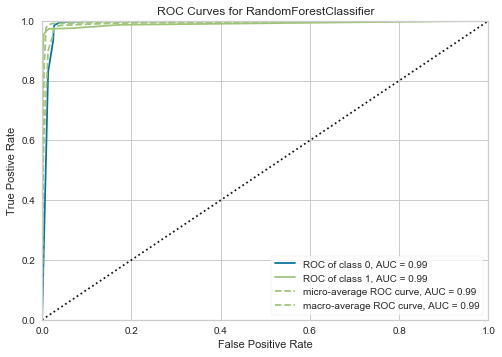

In [41]:
# Visualize the model plots
plot_model(rf_model)

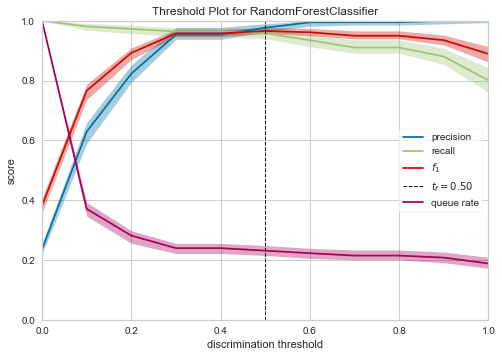

In [42]:
# Visualize the model plots
plot_model(rf_model, plot = 'threshold')

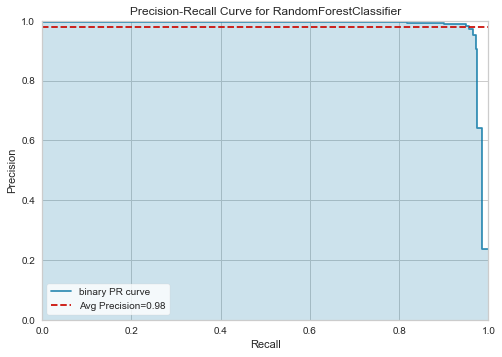

In [43]:
# Visualize the model plots
plot_model(rf_model, plot = 'pr')

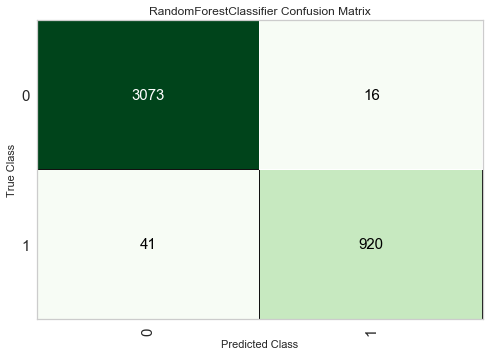

In [44]:
# Visualize the model plots
plot_model(rf_model, plot = 'confusion_matrix')

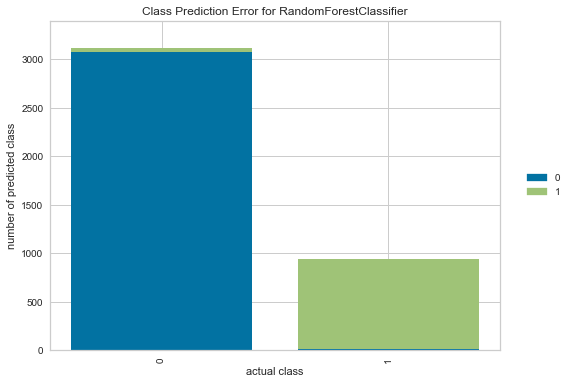

In [45]:
# Visualize the model plots
plot_model(rf_model, plot = 'error')

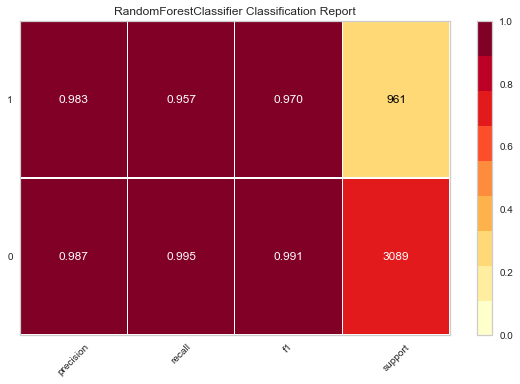

In [46]:
# Visualize the model plots
plot_model(rf_model, plot = 'class_report')

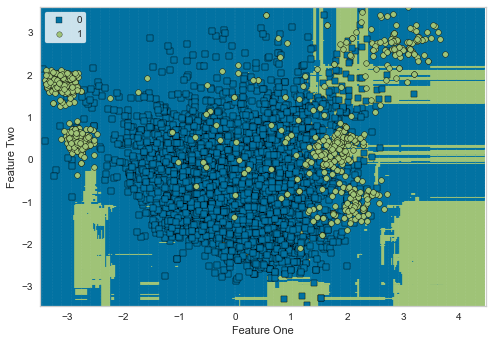

In [47]:
# Visualize the model plots
plot_model(rf_model, plot = 'boundary')

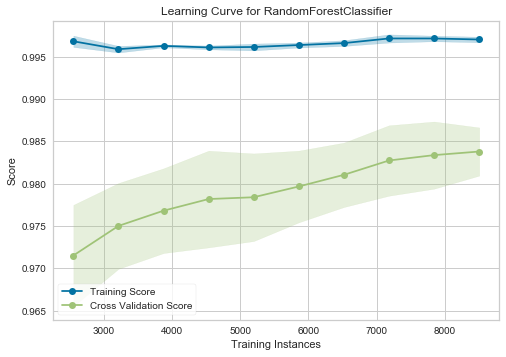

In [48]:
# Visualize the model plots
plot_model(rf_model, plot = 'learning')

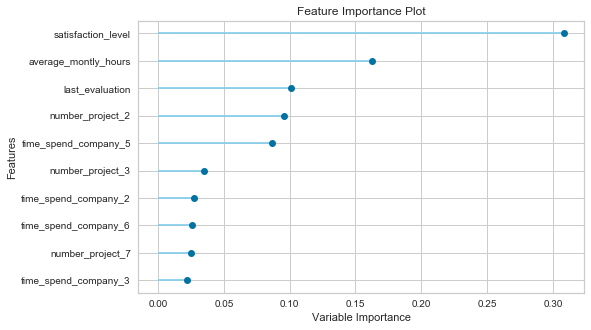

In [49]:
# Visualize the model plots
plot_model(rf_model, plot = 'feature')

In [50]:
# Evaluate the model
evaluate_model(rf_model)

,Parameters
bootstrap,True
ccp_alpha,0
class_weight,None
criterion,gini
max_depth,None
max_features,auto
max_leaf_nodes,None
max_samples,None
min_impurity_decrease,0
min_impurity_split,None


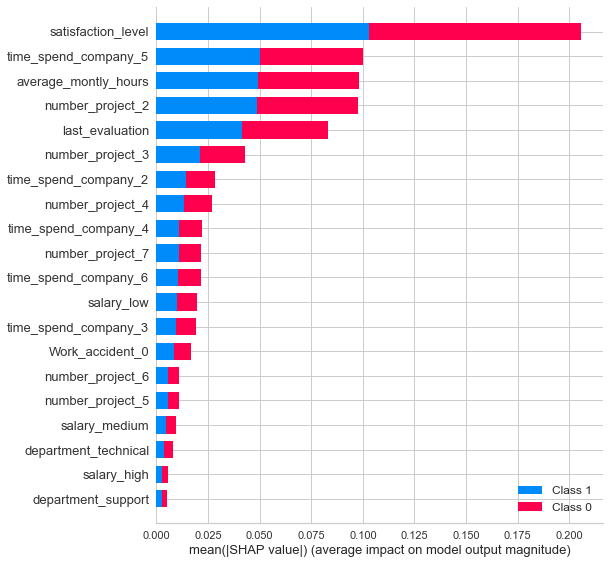

In [51]:
# Summary plot of the model (use only with tree based models)
interpret_model(rf_model, plot = 'summary')

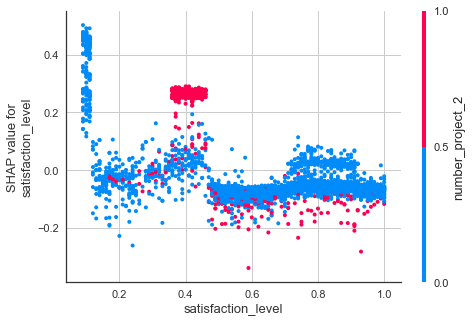

In [52]:
# Correlation plot of the model (use only with tree based models)
interpret_model(rf_model, plot = 'correlation')

In [53]:
# Reason plot of the model (use only with tree based models)
interpret_model(rf_model, plot = 'reason')

In [54]:
# Predict using the model
prediction = predict_model(rf_model)
prediction.head()

,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa
0,Random Forest Classifier,0.9859,0.9897,0.9573,0.9829,0.97,0.9608


,satisfaction_level,last_evaluation,average_montly_hours,number_project_2,number_project_3,number_project_4,number_project_5,number_project_6,number_project_7,time_spend_company_10,...,department_product_mng,department_sales,department_support,department_technical,salary_high,salary_low,salary_medium,left,Label,Score
0,0.56,0.51,256.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,...,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0,0,0.1
1,0.44,0.49,154.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,1.0,0.0,0.0,1.0,0.0,1,1,1.0
2,0.47,0.55,100.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0,0,0.2
3,0.40,0.57,152.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,1.0,0.0,0.0,0.0,1.0,0.0,1,1,0.9
4,0.60,0.94,160.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,...,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0,0,0.0


In [55]:
# Finalize the model (trained also on test set)
final_model = finalize_model(rf_model)

In [56]:
# Predict using the final model
final_prediction = predict_model(final_model)
final_prediction.head()

,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa
0,Random Forest Classifier,0.999,1.0,0.9958,1.0,0.9979,0.9973


,satisfaction_level,last_evaluation,average_montly_hours,number_project_2,number_project_3,number_project_4,number_project_5,number_project_6,number_project_7,time_spend_company_10,...,department_product_mng,department_sales,department_support,department_technical,salary_high,salary_low,salary_medium,left,Label,Score
0,0.56,0.51,256.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,...,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0,0,0.1
1,0.44,0.49,154.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,1.0,0.0,0.0,1.0,0.0,1,1,1.0
2,0.47,0.55,100.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0,0,0.1
3,0.40,0.57,152.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,1.0,0.0,0.0,0.0,1.0,0.0,1,1,1.0
4,0.60,0.94,160.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,...,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0,0,0.0


In [57]:
# Predict on the final test set (10% held out)
unseen_predictions = predict_model(final_model, data = data_unseen)
unseen_predictions.head()

,satisfaction_level,last_evaluation,number_project,average_montly_hours,time_spend_company,Work_accident,promotion_last_5years,department,salary,left,Label,Score
0,0.69,0.76,3,174,6,0,0,sales,medium,0,0,0.0
1,0.98,0.55,3,166,6,1,0,sales,medium,0,0,0.0
2,0.18,0.61,5,174,6,0,0,sales,medium,0,0,0.0
3,0.62,0.91,3,251,10,0,0,sales,medium,0,0,0.0
4,0.29,0.37,6,187,10,1,0,sales,high,0,0,0.0


In [58]:
# Calculate the final Accuracy score on the unseen test set
from sklearn.metrics import accuracy_score
from ast import literal_eval
y_true = unseen_predictions['left']
y_pred = unseen_predictions['Label']
print('Our final model has an Accuracy score of:', accuracy_score(y_true, y_pred), 'on the unseen test set!')

Our final model has an Accuracy score of: 0.998 on the unseen test set!


In [59]:
# Save & show the final model
save_model(final_model, model_name = 'C:/Users/705542/Desktop/Projects/PyCaret Demo Walkthrough/classification_12062020')
load_model('classification_12062020')

Transformation Pipeline and Model Succesfully Saved
Transformation Pipeline and Model Sucessfully Loaded


[Pipeline(memory=None,
          steps=[('dtypes',
                  DataTypes_Auto_infer(categorical_features=[],
                                       display_types=True, features_todrop=[],
                                       ml_usecase='classification',
                                       numerical_features=[], target='left',
                                       time_features=[])),
                 ('imputer',
                  Simple_Imputer(categorical_strategy='not_available',
                                 numeric_strategy='mean',
                                 target_variable=None)),
                 ('new_levels1',
                  New_Catagorical_Level...
                 ('group', Empty()), ('nonliner', Empty()), ('scaling', Empty()),
                 ('P_transform', Empty()), ('pt_target', Empty()),
                 ('binn', Empty()), ('rem_outliers', Empty()),
                 ('cluster_all', Empty()), ('dummy', Dummify(target='left')),
                 ('fix_perfect', Remove_100(target='left')),
                 ('clean_names', Clean_Colum_Names()),
                 ('feature_select', Empty()), ('fix_multi', Empty()),
                 ('dfs', Empty()), ('pca', Empty())],
          verbose=False),
 RandomForestClassifier(bootstrap=True, ccp_alpha=0.0, class_weight=None,
                        criterion='gini', max_depth=None, max_features='auto',
                        max_leaf_nodes=None, max_samples=None,
                        min_impurity_decrease=0.0, min_impurity_split=None,
                        min_samples_leaf=1, min_samples_split=2,
                        min_weight_fraction_leaf=0.0, n_estimators=10,
                        n_jobs=None, oob_score=False, random_state=6779,
                        verbose=0, warm_start=False)]

Awesome! Here we showed that it's super easy as well to create a simple classification model which is potentially really accurate using PyCaret's straightforward 1-liners of code.

Next, let's see if we can create a simple Clustering model!

### 4. Clustering

In [60]:
# Import dataset from pycaret repository
from pycaret.datasets import get_data
clustering_data = get_data('wholesale')

,Channel,Region,Fresh,Milk,Grocery,Frozen,Detergents_Paper,Delicassen
0,2,3,12669,9656,7561,214,2674,1338
1,2,3,7057,9810,9568,1762,3293,1776
2,2,3,6353,8808,7684,2405,3516,7844
3,1,3,13265,1196,4221,6404,507,1788
4,2,3,22615,5410,7198,3915,1777,5185


Let's see if we can cluster some wholesale stores by where they're located & how many products they offer per product type.

In [61]:
# Hold out 10% of the dataset for predicting with the final model
data = clustering_data.sample(frac=0.9, random_state=1234).reset_index(drop=True)
data_unseen = clustering_data.drop(data.index).reset_index(drop=True)

print('Data for Modeling: ' + str(data.shape))
print('Unseen Data For Predictions: ' + str(data_unseen.shape))

Data for Modeling: (396, 8)
Unseen Data For Predictions: (44, 8)


In [62]:
from pycaret.clustering import *
clustering_setup = setup(data, normalize = True)


Setup Succesfully Completed!


,Description,Value
0,session_id,2484
1,Original Data,"(396, 8)"
2,Missing Values,False
3,Numeric Features,6
4,Categorical Features,2
5,Ordinal Features,False
6,High Cardinality Features,False
7,Transformed Data,"(396, 11)"
8,Numeric Imputer,mean
9,Categorical Imputer,constant


Since we can't compare models (we have no output metrics to compare them against), we're going to try 3 different clustering algorithms and check which one makes most sense to use in predicting clusters for new data.

Check out this link if you want to see all possible algorithms to use for clustering: https://pycaret.org/clustering/

#### 4.1 K-Means Clustering

In [63]:
# Create the kmeans model
kmeans_model = create_model('kmeans', num_clusters = 5)

In [64]:
# Assign each row to a cluster
kmeans_results = assign_model(kmeans_model)
kmeans_results.head()

,Channel,Region,Fresh,Milk,Grocery,Frozen,Detergents_Paper,Delicassen,Cluster
0,1,3,16260,594,1296,848,445,258,Cluster 0
1,2,2,8090,3199,6986,1455,3712,531,Cluster 4
2,1,2,1182,3088,6114,978,821,1637,Cluster 0
3,1,3,3047,5970,4910,2198,850,317,Cluster 0
4,2,3,5981,14641,20521,2005,12218,445,Cluster 4


In [65]:
# Plot the model PCA clusters, elbow method optimal clusters & distribution
plot_model(kmeans_model)

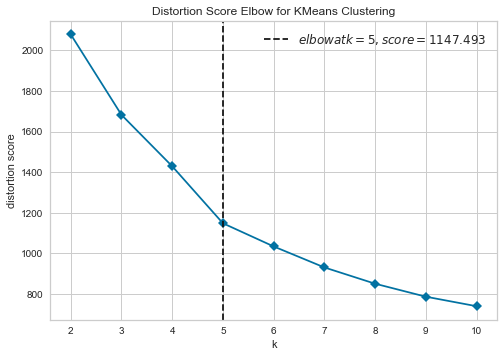

In [66]:
plot_model(kmeans_model, plot = 'elbow') # It seems 5 clusters is optimal in this context

In [67]:
plot_model(kmeans_model, plot = 'tsne')

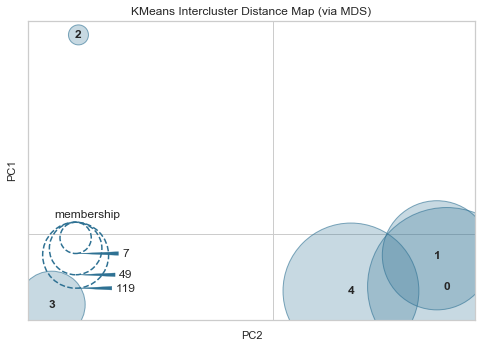

In [68]:
plot_model(kmeans_model, plot = 'distance')

In [69]:
plot_model(kmeans_model, plot = 'distribution', feature = 'Cluster') #to see size of clusters

In [70]:
# Predict the cluster for the unseen data
unseen_predictions = predict_model(kmeans_model, data = data_unseen)
unseen_predictions.head()

,Channel,Region,Fresh,Milk,Grocery,Frozen,Detergents_Paper,Delicassen,Cluster
0,2,3,4515,11991,9345,2644,3378,2213,Cluster 4
1,1,3,11535,1666,1428,6838,64,743,Cluster 0
2,1,3,11442,1032,582,5390,74,247,Cluster 0
3,1,3,9612,577,935,1601,469,375,Cluster 0
4,1,3,4446,906,1238,3576,153,1014,Cluster 0


#### 4.2 K-Modes Clustering

In [71]:
# Create the kmodes model
kmodes_model = create_model('kmodes', num_clusters = 4)

In [72]:
# Assign each row to a cluster
kmodes_results = assign_model(kmodes_model)
kmodes_results.head()

,Channel,Region,Fresh,Milk,Grocery,Frozen,Detergents_Paper,Delicassen,Cluster
0,1,3,16260,594,1296,848,445,258,Cluster 0
1,2,2,8090,3199,6986,1455,3712,531,Cluster 1
2,1,2,1182,3088,6114,978,821,1637,Cluster 0
3,1,3,3047,5970,4910,2198,850,317,Cluster 0
4,2,3,5981,14641,20521,2005,12218,445,Cluster 1


In [73]:
# Plot the model PCA clusters, elbow method optimal clusters & distribution
plot_model(kmodes_model)

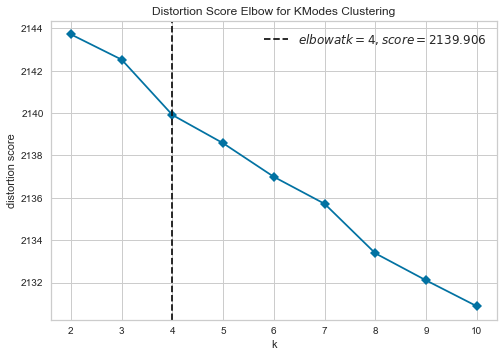

In [74]:
plot_model(kmodes_model, plot = 'elbow') # It seems 4 clusters is optimal, however 8 clusters might also be worth a try

In [75]:
plot_model(kmodes_model, plot = 'tsne')

In [76]:
plot_model(kmodes_model, plot = 'distribution', feature = 'Cluster')

In [77]:
# Predict the cluster for the unseen data
unseen_predictions = predict_model(kmodes_model, data=data_unseen)
unseen_predictions.head()

,Channel,Region,Fresh,Milk,Grocery,Frozen,Detergents_Paper,Delicassen,Cluster
0,2,3,4515,11991,9345,2644,3378,2213,Cluster 1
1,1,3,11535,1666,1428,6838,64,743,Cluster 0
2,1,3,11442,1032,582,5390,74,247,Cluster 0
3,1,3,9612,577,935,1601,469,375,Cluster 0
4,1,3,4446,906,1238,3576,153,1014,Cluster 0


#### 4.3 Meanshift Clustering

In [78]:
# Create the meanshift model
meanshift_model = create_model('meanshift') # doesn't require predefined # clusters

In [79]:
# Assign each row to a cluster
meanshift_results = assign_model(meanshift_model)
meanshift_results.head()

,Channel,Region,Fresh,Milk,Grocery,Frozen,Detergents_Paper,Delicassen,Cluster
0,1,3,16260,594,1296,848,445,258,Cluster 0
1,2,2,8090,3199,6986,1455,3712,531,Cluster 0
2,1,2,1182,3088,6114,978,821,1637,Cluster 0
3,1,3,3047,5970,4910,2198,850,317,Cluster 0
4,2,3,5981,14641,20521,2005,12218,445,Cluster 0


In [80]:
# Plot the model PCA clusters & distribution
plot_model(meanshift_model)

In [81]:
plot_model(meanshift_model, plot = 'tsne')

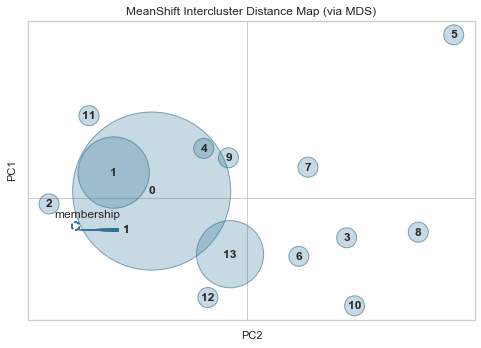

In [82]:
plot_model(meanshift_model, plot = 'distance')

In [83]:
plot_model(meanshift_model, plot = 'distribution', feature = 'Cluster')

In [84]:
# Predict the cluster for the unseen data
unseen_predictions = predict_model(meanshift_model, data=data_unseen)
unseen_predictions.head()

,Channel,Region,Fresh,Milk,Grocery,Frozen,Detergents_Paper,Delicassen,Cluster
0,2,3,4515,11991,9345,2644,3378,2213,Cluster 0
1,1,3,11535,1666,1428,6838,64,743,Cluster 0
2,1,3,11442,1032,582,5390,74,247,Cluster 0
3,1,3,9612,577,935,1601,469,375,Cluster 0
4,1,3,4446,906,1238,3576,153,1014,Cluster 0


Since there's no real metric to weigh the models against, choosing the model is more subjective. Intuitively, the K-Means clustering model seems to make the most sense in terms of number of clusters and distribution among the clusters. So let's go ahead with using the K-Means model for our cluster predictions and save it to our folder.

In [85]:
# Save & show the final model
save_model(kmeans_model, model_name = 'C:/Users/705542/Desktop/Projects/PyCaret Demo Walkthrough/clustering_12062020')
load_model('clustering_12062020')

Transformation Pipeline and Model Succesfully Saved
Transformation Pipeline and Model Sucessfully Loaded


[Pipeline(memory=None,
          steps=[('dtypes',
                  DataTypes_Auto_infer(categorical_features=[],
                                       display_types=True, features_todrop=[],
                                       ml_usecase='regression',
                                       numerical_features=[],
                                       target='dummy_target',
                                       time_features=[])),
                 ('imputer',
                  Simple_Imputer(categorical_strategy='not_available',
                                 numeric_strategy='mean',
                                 target_variable=None)),
                 ('new_levels1',
                  New_Catagorical_L...
                 ('group', Empty()),
                 ('scaling',
                  Scaling_and_Power_transformation(function_to_apply='zscore',
                                                   random_state_quantile=2484,
                                                   target='dummy_target')),
                 ('P_transform', Empty()), ('binn', Empty()),
                 ('fix_perfect', Empty()), ('rem_outliers', Empty()),
                 ('dummy', Dummify(target='dummy_target')),
                 ('clean_names', Clean_Colum_Names()), ('fix_multi', Empty()),
                 ('pca', Empty())],
          verbose=False),
 KMeans(algorithm='auto', copy_x=True, init='k-means++', max_iter=300,
        n_clusters=5, n_init=10, n_jobs=None, precompute_distances='auto',
        random_state=2484, tol=0.0001, verbose=0)]

### 5. NLP

Now that we've gone through Regression, Classification and Clustering, let's finalize this walkthrough with an NLP example!

We're going to use an LDA model to determine whether a review on Amazon is positive or negative.

Check out this link if you want to know more about NLP in PyCaret: https://pycaret.org/nlp/

In [86]:
'''

Note: Some functionalities in pycaret.nlp requires english language model. The language model is not downloaded 
automatically when you install pycaret. To download the model, please type the following in your command line:

python -m spacy download en_core_web_sm
python -m textblob.download_corpora

'''

'\n\nNote: Some functionalities in pycaret.nlp requires english language model. The language model is not downloaded \nautomatically when you install pycaret. To download the model, please type the following in your command line:\n\npython -m spacy download en_core_web_sm\npython -m textblob.download_corpora\n\n'

In [87]:
# Import dataset from pycaret repository
from pycaret.datasets import get_data
nlp_data = get_data('kiva')

,country,en,gender,loan_amount,nonpayment,sector,status
0,Dominican Republic,"""Banco Esperanza"" is a group of 10 women looki...",F,1225,partner,Retail,0
1,Dominican Republic,"""Caminemos Hacia Adelante"" or ""Walking Forward...",F,1975,lender,Clothing,0
2,Dominican Republic,"""Creciendo Por La Union"" is a group of 10 peop...",F,2175,partner,Clothing,0
3,Dominican Republic,"""Cristo Vive"" (""Christ lives"" is a group of 10...",F,1425,partner,Clothing,0
4,Dominican Republic,"""Cristo Vive"" is a large group of 35 people, 2...",F,4025,partner,Food,0


In [88]:
# sampling the data to select only 1000 documents
data = nlp_data.sample(1000, random_state=786).reset_index(drop=True)

In [89]:
from pycaret.nlp import *
nlp_setup = setup(data = data, target = 'en', session_id = 1234)

Description,Value
session_id,1234
# Documents,1000
Vocab Size,4573
Custom Stopwords,False


In [90]:
# Create an LDA model
lda = create_model('lda')
print(lda)

LdaModel(num_terms=4573, num_topics=4, decay=0.5, chunksize=100)


In [91]:
# Create an LDA model with different settings
lda2 = create_model('lda', num_topics = 6, multi_core = True)
print(lda2)

LdaModel(num_terms=4573, num_topics=6, decay=0.5, chunksize=100)


In [92]:
# Assign the model we want to use
lda_results = assign_model(lda)
lda_results.head()

,country,en,gender,loan_amount,nonpayment,sector,status,Topic_0,Topic_1,Topic_2,Topic_3,Dominant_Topic,Perc_Dominant_Topic
0,Kenya,praxide marry child primary school train tailo...,F,75,partner,Services,0,0.842683,0.003086,0.153708,0.000523,Topic 0,0.84
1,Kenya,practitioner run year old life wife child biol...,M,1200,partner,Health,0,0.391427,0.560114,0.047955,0.000504,Topic 1,0.56
2,Dominican Republic,live child boy girl range year sell use clothi...,F,150,partner,Clothing,0,0.206955,0.003342,0.789135,0.000568,Topic 2,0.79
3,Kenya,phanice marry child daughter secondary school ...,F,150,lender,Services,1,0.643340,0.003431,0.352649,0.000580,Topic 0,0.64
4,Kenya,year old hotel kaptembwa operating hotel last ...,F,300,lender,Food,1,0.924990,0.050469,0.024028,0.000514,Topic 0,0.92


Having assigned the LDA model, we can see it clusters each sentence in one of the four topics with a particular degree of certainty.

In [93]:
# Plot the top 100 words after removing stopwords
plot_model()

In [94]:
# Plot the top 100 bigrams of the entire corpus
plot_model(plot = 'bigram')

In [95]:
# Plot the topic distribution
plot_model(lda, plot = 'topic_distribution')

In [96]:
# Plot the tnse
plot_model(lda, plot = 'tsne')

In [97]:
# # Plot the umap
# plot_model(lda, plot = 'umap')

In [98]:
# Evaluate the model
evaluate_model(lda)

interactive(children=(ToggleButtons(description='Plot Type:', icons=('',), options=(('Frequency Plot', 'freque…

In [99]:
# Save & show the final model
save_model(lda, model_name = 'C:/Users/705542/Desktop/Projects/PyCaret Demo Walkthrough/nlp_12062020')
load_model('nlp_12062020')

Model Succesfully Saved
Model Sucessfully Loaded


Awesome, you've made it to the end!

I hope you enjoyed going through this exploration of most of PyCaret's functions & abilities! It was quite extensive, however I hope you got as excited as I got when I tried out all of these different use cases in a really short window of time.

I think this Python module is extremely beneficial for creating quick & dirty optimized modelling examples for whatever use-case you're working on. Showing an accurate & working model, ready for deployment will most certainly impress all stakeholders, since it's more tangible than any hypothetical flow-chart of such a model and it shows them you have 100% the capability to build it!

If you want to connect with me on LinkedIn, you can find me at: https://www.linkedin.com/in/michael-tuijp/